In [1]:
from pathlib import Path

from adain_model import AdaINModel, AdaINLoss
from adain_datamodule import AdaINDataModule
from adain_trainer import AdaINTrainer

import os
os.environ["KERAS_BACKEND"] = "torch"
import keras
import torch

In [2]:
run_id = '6c755ca8e1254ed0957495736db1d4d1'
train_epochs = 6
start_epoch = 13
dataset_size = 100000
lr = 1e-4
decay_rate = 5e-5
decay_steps = 1
style_loss_weight = 3
tv_weight = 0
additional_tags = {'Upsampling' : 'Nearest', 'Style_loss' : 'Gram_matrix'}

In [3]:
dm = AdaINDataModule(Path("D:/StyleTransferAI/StyleTransferAI_AdaIN/datasets/unlabeled2017/"), Path("D:/StyleTransferAI/StyleTransferAI_AdaIN/datasets/WikiArt/"), dataset_size=dataset_size, seed=4444, batch_size=8)
if run_id != '' :
    model = AdaINModel.load_from_mlflow(run_id, Path("D:/Python/ML Flow/mlruns"))
else :
    model = AdaINModel()
    model.compile(optimizer='adam')
if decay_rate != 0 :
    model.optimizer.learning_rate = keras.optimizers.schedules.InverseTimeDecay(initial_learning_rate=lr, decay_steps=decay_steps, decay_rate=decay_rate)
else :
    model.optimizer.learning_rate = lr
model.loss_ = AdaINLoss(style_loss_weight=style_loss_weight, tv_weight=tv_weight)

d:\Python\StyleTransferAI\Lib\site-packages\keras\src\saving\saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 38 variables whereas the saved optimizer has 37 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [4]:
total_epochs = start_epoch + train_epochs
trainer = AdaINTrainer(model, dm, 'adam', mlflow_dir=Path("D:/Python/ML Flow/mlruns"), mlflow_tags={"Dataset size" : dataset_size, "Real training" : True, "Total epochs" : f'{total_epochs} ({10*total_epochs} Keras epochs)', "Start epoch" : start_epoch, **additional_tags})
trainer.train(epochs=10*train_epochs, steps_per_epoch=1000, log_every_n_epochs=10, validation_steps=125, test_steps=125)

Initiating datasets...
Compiling the model...
Model is ready to be trained
Training the model...


Epoch 1/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 550s 550ms/step - loss: 263489.6875 - val_loss: 247114.9062
Epoch 2/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 565s 565ms/step - loss: 276556.8750 - val_loss: 264208.2500
Epoch 3/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 571s 571ms/step - loss: 272698.9688 - val_loss: 262415.1250
Epoch 4/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 574s 574ms/step - loss: 260061.9219 - val_loss: 880713.5625
Epoch 5/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 577s 577ms/step - loss: 330103.4375 - val_loss: 257157.0781
Epoch 6/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 576s 576ms/step - loss: 303079.4062 - val_loss: 231735.9219
Epoch 7/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 577s 577ms/step - loss: 257973.1875 - val_loss: 285043.4688
Epoch 8/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 576s 576ms/step - loss: 276863.0938 - val_loss: 266549.1250
Epoch 9/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 579s 579ms/step - loss: 259518.3438 - val_loss: 241246.0156
Epoch 10/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 576s 576ms/step - loss: 259631.4375 - v

Epoch 11/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 574s 574ms/step - loss: 243272.6719 - val_loss: 283713.5000
Epoch 12/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 573s 573ms/step - loss: 280791.0000 - val_loss: 248682.8594
Epoch 13/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 575s 576ms/step - loss: 260295.1094 - val_loss: 559100.0625
Epoch 14/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 575s 575ms/step - loss: 352414.0938 - val_loss: 274714.0312
Epoch 15/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 575s 575ms/step - loss: 240868.3281 - val_loss: 263613.0000
Epoch 16/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 579s 579ms/step - loss: 231319.9219 - val_loss: 254325.0312
Epoch 17/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 577s 577ms/step - loss: 247398.5156 - val_loss: 268472.8125
Epoch 18/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 578s 578ms/step - loss: 256525.1094 - val_loss: 227317.3281
Epoch 19/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 575s 576ms/step - loss: 237507.5000 - val_loss: 234661.8594
Epoch 20/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 579s 580ms/step - loss: 256033

Epoch 21/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 578s 578ms/step - loss: 243236.1406 - val_loss: 239531.7969
Epoch 22/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 577s 577ms/step - loss: 226776.7188 - val_loss: 234627.4688
Epoch 23/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 577s 577ms/step - loss: 484467.0312 - val_loss: 251584.6250
Epoch 24/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 577s 577ms/step - loss: 235122.3906 - val_loss: 238929.4844
Epoch 25/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 577s 577ms/step - loss: 236083.8906 - val_loss: 242722.5469
Epoch 26/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 576s 576ms/step - loss: 228673.7656 - val_loss: 220308.7969
Epoch 27/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 578s 578ms/step - loss: 234697.0469 - val_loss: 227982.5781
Epoch 28/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 579s 579ms/step - loss: 240660.2188 - val_loss: 263066.7812
Epoch 29/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 579s 579ms/step - loss: 233780.0781 - val_loss: 247878.1094
Epoch 30/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 579s 579ms/step - loss: 258093

Epoch 31/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 579s 579ms/step - loss: 238296.4375 - val_loss: 253444.0781
Epoch 32/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 577s 577ms/step - loss: 233401.1719 - val_loss: 212557.9531
Epoch 33/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 578s 578ms/step - loss: 253685.4219 - val_loss: 227251.4844
Epoch 34/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 578s 578ms/step - loss: 231181.2812 - val_loss: 225015.9375
Epoch 35/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 578s 578ms/step - loss: 230562.0000 - val_loss: 220603.1406
Epoch 36/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 579s 579ms/step - loss: 230399.5469 - val_loss: 210550.6562
Epoch 37/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 579s 579ms/step - loss: 217516.9688 - val_loss: 234463.9062
Epoch 38/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 578s 579ms/step - loss: 222520.9531 - val_loss: 249783.8125
Epoch 39/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 579s 579ms/step - loss: 246498.6094 - val_loss: 223816.4844
Epoch 40/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 578s 578ms/step - loss: 235345

Epoch 41/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 577s 577ms/step - loss: 222396.9062 - val_loss: 222156.8281
Epoch 42/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 577s 577ms/step - loss: 226797.5312 - val_loss: 228796.1406
Epoch 43/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 577s 577ms/step - loss: 215159.9844 - val_loss: 276359.6562
Epoch 44/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 577s 577ms/step - loss: 250671.0469 - val_loss: 315162.1562
Epoch 45/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 577s 577ms/step - loss: 238598.0781 - val_loss: 219190.7031
Epoch 46/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 577s 578ms/step - loss: 217664.3750 - val_loss: 217168.6562
Epoch 47/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 575s 575ms/step - loss: 232463.0938 - val_loss: 212873.8906
Epoch 48/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 577s 577ms/step - loss: 216672.9844 - val_loss: 253087.1719
Epoch 49/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 579s 579ms/step - loss: 226383.8594 - val_loss: 193907.6562
Epoch 50/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 577s 577ms/step - loss: 212421

Epoch 51/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 578s 578ms/step - loss: 216631.6562 - val_loss: 228329.5156
Epoch 52/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 577s 577ms/step - loss: 207689.0000 - val_loss: 213587.2500
Epoch 53/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 577s 577ms/step - loss: 210522.0312 - val_loss: 206997.5625
Epoch 54/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 578s 578ms/step - loss: 220401.5312 - val_loss: 214838.7500
Epoch 55/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 576s 576ms/step - loss: 224110.3125 - val_loss: 219401.5000
Epoch 56/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 576s 576ms/step - loss: 229006.6719 - val_loss: 194348.7812
Epoch 57/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 578s 578ms/step - loss: 257211.2969 - val_loss: 219531.8125
Epoch 58/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 577s 577ms/step - loss: 229875.2812 - val_loss: 228852.6875
Epoch 59/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 576s 576ms/step - loss: 208867.3125 - val_loss: 221455.9219
Epoch 60/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 577s 577ms/step - loss: 198892

In [5]:
imgs = []
torch.random.manual_seed(444)
for i, ((content, style), _) in enumerate(dm._train_dataset) :
    if i == 20 :
        break
    gen_img = model.generate(content, style)
    imgs.append([content.type(torch.int), style.type(torch.int), gen_img])

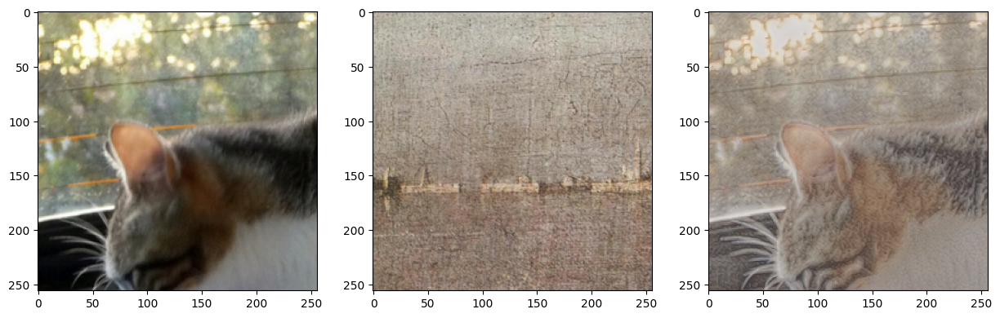

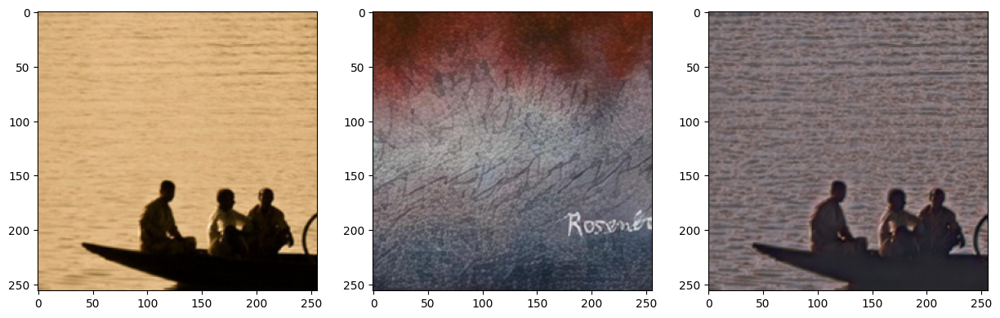

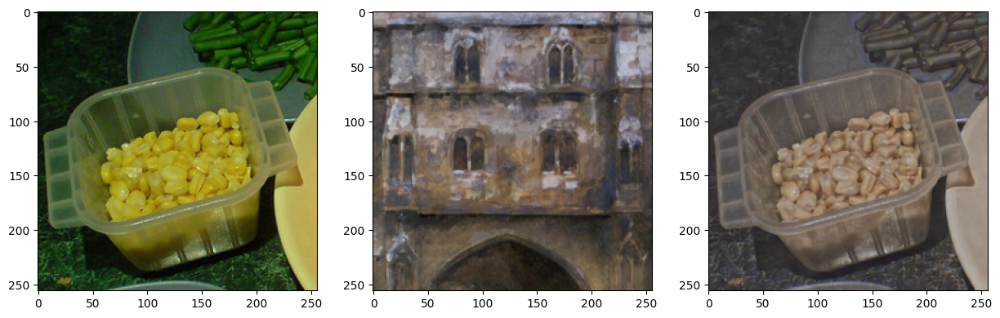

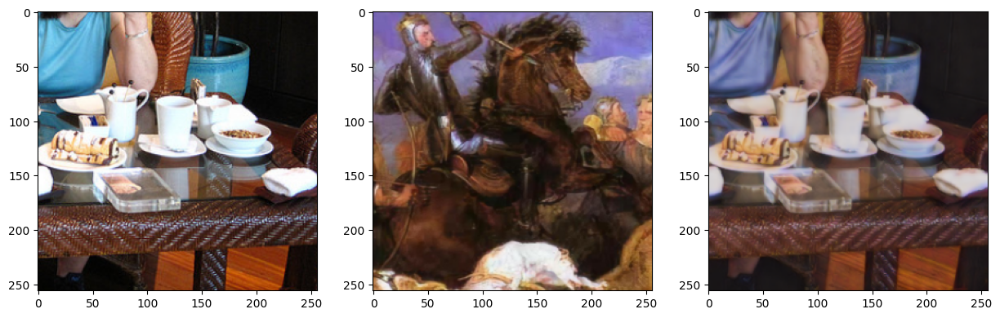

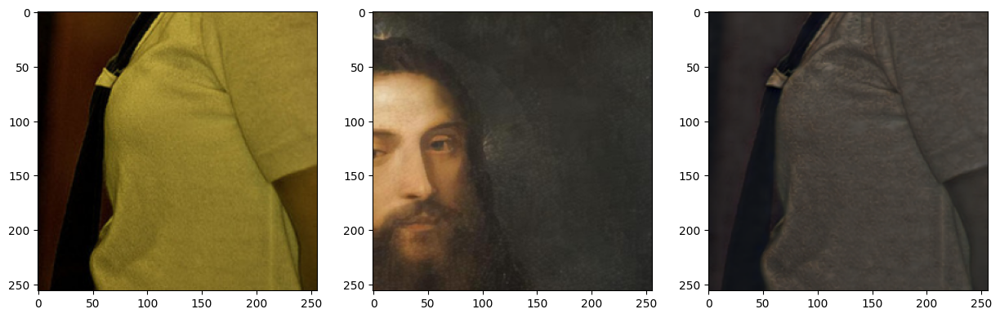

...

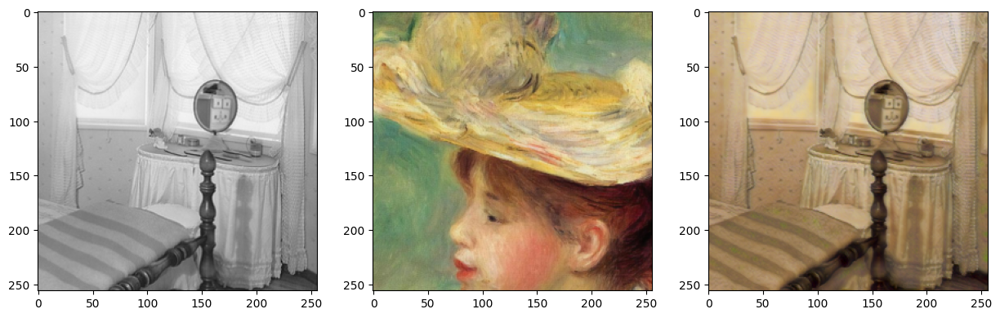

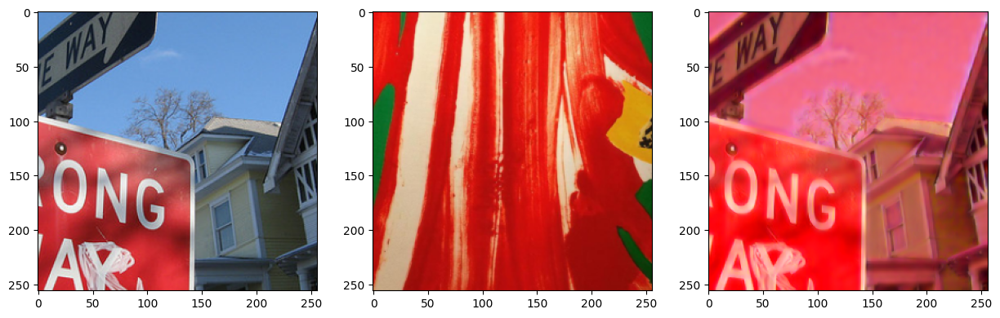

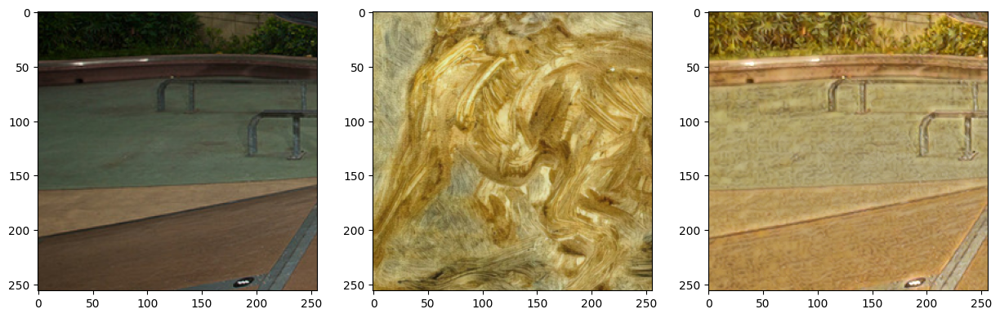

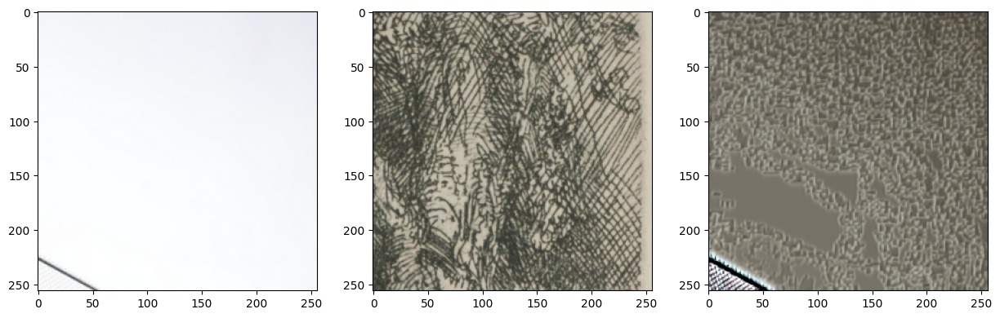

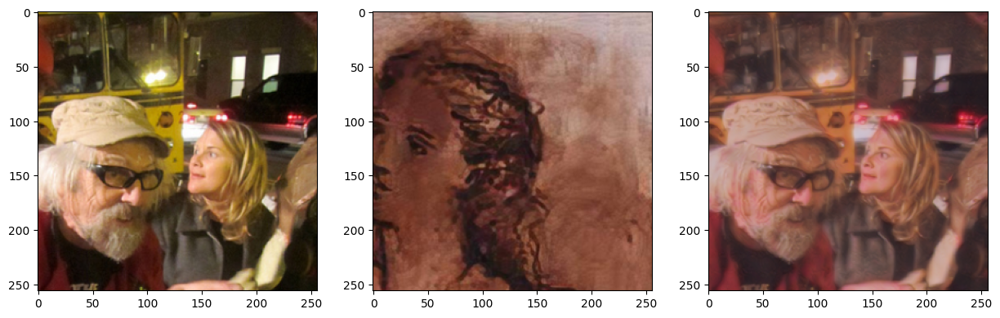

In [6]:
import matplotlib.pyplot as plt

for gen in imgs :
    fig, axs = plt.subplots(1,3, figsize=(15,5))
    for i in range(3) :
        axs[i].imshow(gen[i])
    plt.show()

In [7]:
wolf = Path('D:/StyleTransferAI/StyleTransferAI/test_images/wolf_forest.jpg')
van_gogh = Path('D:/StyleTransferAI/StyleTransferAI/test_images/van_gogh.jpg')
nature = Path('D:/StyleTransferAI/StyleTransferAI/test_images/nature.jpg')
wp = Path('D:/StyleTransferAI/StyleTransferAI/test_images/wallpaper.jpg')
wolf_big = Path('D:/StyleTransferAI/StyleTransferAI/test_images/wolf_forest_big.jpg')
lion = Path('D:/StyleTransferAI/StyleTransferAI/test_images/lion.jpg')
fishes = Path('D:/StyleTransferAI/StyleTransferAI/test_images/peinture.webp')
drawing = Path('D:/StyleTransferAI/StyleTransferAI/test_images/croquis.jpg')

size = 1500

wolf_img = torch.tensor(keras.utils.img_to_array(keras.utils.load_img(wolf))).unsqueeze(0)
sec_size = int((wolf_img.shape[2] / wolf_img.shape[1]) * size)
scaled_wolf = torch.nn.functional.interpolate(wolf_img.permute((0,3,1,2)), (size,sec_size), mode='bilinear').type(torch.int).permute((0,2,3,1))[0]

lion_img = torch.tensor(keras.utils.img_to_array(keras.utils.load_img(lion))).unsqueeze(0)
sec_size_lion = int((lion_img.shape[2] / lion_img.shape[1]) * size)
scaled_lion = torch.nn.functional.interpolate(lion_img.permute((0,3,1,2)), (size,sec_size_lion), mode='bilinear').type(torch.int).permute((0,2,3,1))[0]

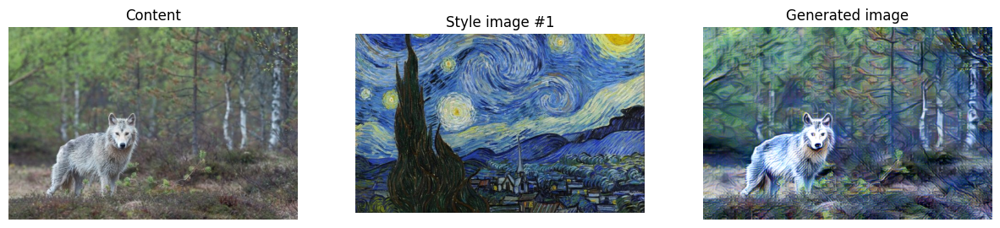

In [8]:
model.generate(wolf, van_gogh, show_img=True, show_inputs=True, resize_size=None)

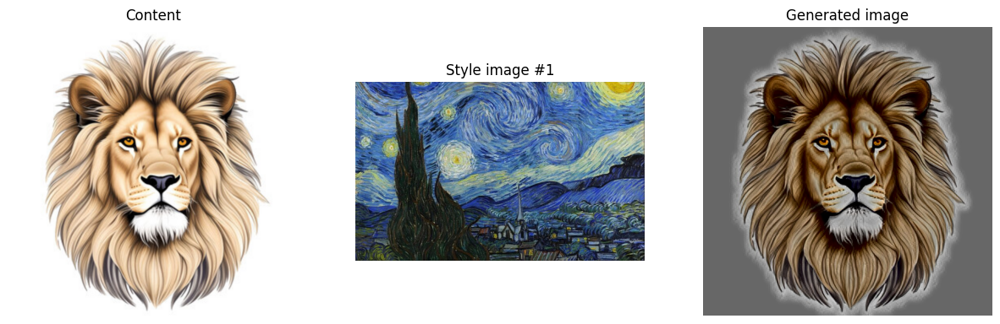

In [9]:
model.generate(scaled_lion, van_gogh, preserve_colors=True, show_img=True, show_inputs=True)

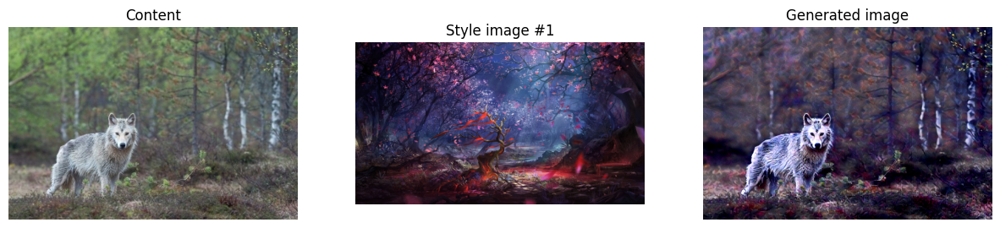

In [10]:
model.generate(wolf, wp, show_img=True, show_inputs=True)

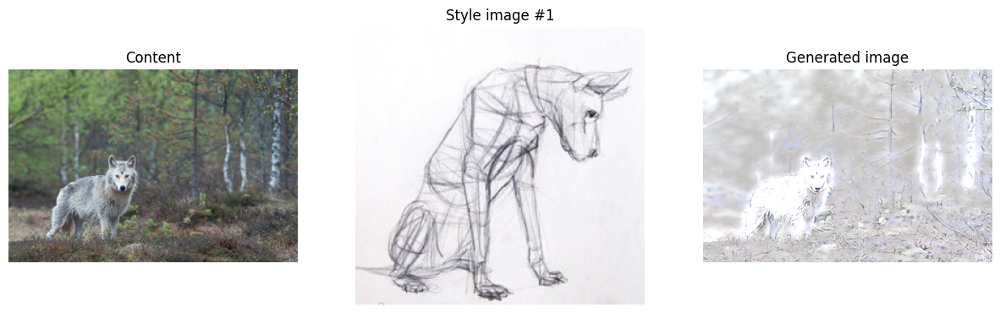

In [11]:
model.generate(wolf, drawing, show_img=True, show_inputs=True, style_scales=0.2)

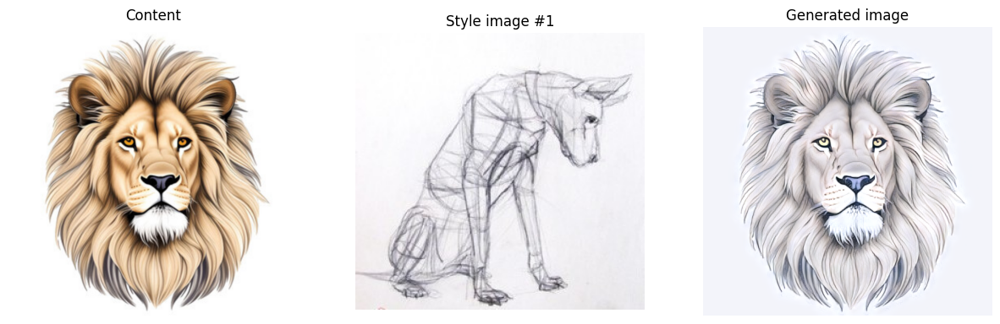

In [12]:
model.generate(scaled_lion, drawing, show_img=True, show_inputs=True, style_scales = 0.2)